In [1]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import numpy as np
import matplotlib.pyplot as plt
import os
import rasterio
from rasterio.plot import show

In [2]:
def hillshade(array, azimuth=315, angle_altitude=45):
    az = np.deg2rad(azimuth)
    alt = np.deg2rad(angle_altitude)

    x, y = np.gradient(array.astype(float))
    slope = np.pi / 2.0 - np.arctan(np.sqrt(x * x + y * y))
    aspect = np.arctan2(-x, y)

    shaded = (np.sin(alt) * np.sin(slope) +
              np.cos(alt) * np.cos(slope) * np.cos(az - aspect))
    return 255 * (shaded + 1) / 2


def resample_to_resolution(src, new_resolution):
    transform, width, height = calculate_default_transform(
        src.crs, src.crs,
        src.width, src.height,
        *src.bounds,
        resolution=new_resolution
    )

    profile = src.profile.copy()
    profile.update({
        "height": height,
        "width": width,
        "transform": transform
    })

    data_resampled = np.empty((height, width), dtype=src.profile["dtype"])

    reproject(
        source=rasterio.band(src, 1),
        destination=data_resampled,
        src_transform=src.transform,
        src_crs=src.crs,
        dst_transform=transform,
        dst_crs=src.crs,
        resampling=Resampling.bilinear
    )

    return data_resampled, profile


In [3]:
src_path = "../saopaulo_menos_teste.tif"  # troque pelo caminho do TIFF GeoSampa

with rasterio.open(src_path) as src:
    data_05m = src.read(1)

    data_5m, profile_5m = resample_to_resolution(src, 5) 
    data_10m, profile_10m = resample_to_resolution(src, 10)
    data_30m, profile_30m = resample_to_resolution(src, 30)

    # --- salvar os reamostrados em disco ---
    with rasterio.open("../dados/sp_5m.tif", "w", **profile_5m) as dst:
        dst.write(data_5m, 1)

    # with rasterio.open("geosampa_10m.tif", "w", **profile_10m) as dst:
    #     dst.write(data_10m, 1)

    # with rasterio.open("geosampa_30m.tif", "w", **profile_30m) as dst:
    #     dst.write(data_30m, 1)

MemoryError: Unable to allocate 51.2 GiB for an array with shape (1, 145065, 94696) and data type float32

In [ ]:
from rasterio.io import MemoryFile

def reproject_to_crs(src, dst_crs="EPSG:31983"):
    """Reproject a rasterio dataset into an in-memory dataset with dst_crs."""
    transform, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds
    )
    profile = src.profile.copy()
    profile.update({
        "crs": dst_crs,
        "transform": transform,
        "width": width,
        "height": height,
        "count": 1
    })

    data = np.empty((height, width), dtype=src.profile["dtype"])

    reproject(
        source=rasterio.band(src, 1),
        destination=data,
        src_transform=src.transform,
        src_crs=src.crs,
        dst_transform=transform,
        dst_crs=dst_crs,
        resampling=Resampling.bilinear
    )

    mem = MemoryFile()
    dst = mem.open(**profile)
    dst.write(data, 1)
    return dst, mem

# substituir o bloco existente que abre src_path pelo abaixo
# src_path = "../dados/MDTGeosampa_AricanduvaBufferUTM.tif"  # troque pelo caminho do TIFF GeoSampa

with rasterio.open(src_path) as src:
    print("Input CRS:", src.crs)
    # se necessário, reprojeta para SIRGAS2000 / UTM zone 23S (EPSG:31983)
    if src.crs is None or src.crs.to_string() != "EPSG:31983":
        src_reproj, memfile = reproject_to_crs(src, "EPSG:31983")
        reprojected_in_memory = True
        print("Reprojected to EPSG:31983")
    else:
        src_reproj = src
        memfile = None
        reprojected_in_memory = False
        print("Already EPSG:31983")

    # agora usa o dataset (original ou reprojectado) para ler / reamostrar
    data_05m = src_reproj.read(1)

    data_5m, profile_5m = resample_to_resolution(src_reproj, 5)
    data_10m, profile_10m = resample_to_resolution(src_reproj, 10)
    data_30m, profile_30m = resample_to_resolution(src_reproj, 30)

    # salvar os reamostrados em disco se quiser
    with rasterio.open("../dados/geosampa_5m_reproj.tif", "w", **profile_5m) as dst:
        dst.write(data_5m, 1)

    # liberar memória se usamos MemoryFile
    if reprojected_in_memory:
        src_reproj.close()
        memfile.close()
# ...existing code...

Input CRS: EPSG:32723


In [6]:
# ...existing code...
def reproject_keep_resolution(src_fp, dst_fp, dst_crs="EPSG:31983", resampling=Resampling.bilinear):
    """Reproject raster to dst_crs keeping the input pixel size (no change to resolution value)."""
    with rasterio.open(src_fp) as src:
        print("Input CRS:", src.crs)
        if src.crs is not None and src.crs.to_string() == dst_crs:
            print("Já está em", dst_crs)
            # copia arquivo ou retorna
            return

        # pegar resolução do arquivo de entrada (em units do CRS de entrada, normalmente metros)
        res_x = abs(src.transform.a)
        res_y = abs(src.transform.e)

        # calcular transform/dimensão alvo usando a mesma resolução (em unidades do destino)
        dst_transform, dst_width, dst_height = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds, resolution=(res_x, res_y)
        )

        profile = src.profile.copy()
        profile.update({
            "crs": dst_crs,
            "transform": dst_transform,
            "width": dst_width,
            "height": dst_height,
            "count": src.count
        })

        # alocar array de saída e reprojetar
        dst_data = np.empty((src.count, dst_height, dst_width), dtype=src.dtypes[0])
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=dst_data[i - 1],
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=dst_transform,
                dst_crs=dst_crs,
                resampling=resampling
            )

        # escrever o arquivo reprojetado
        with rasterio.open(dst_fp, "w", **profile) as dst:
            dst.write(dst_data)

        print(f"Reprojected saved to: {dst_fp}")

# Uso — ajuste caminhos conforme necessário
src_fp = "../dados/geosampa_5m.tif"
dst_fp = "../dados/geosampa_5m_reprojetado.tif"
reproject_keep_resolution(src_fp, dst_fp, "EPSG:31983", resampling=Resampling.bilinear)
# ...existing code...

Input CRS: EPSG:32723
Reprojected saved to: ../dados/geosampa_5m_reprojetado.tif


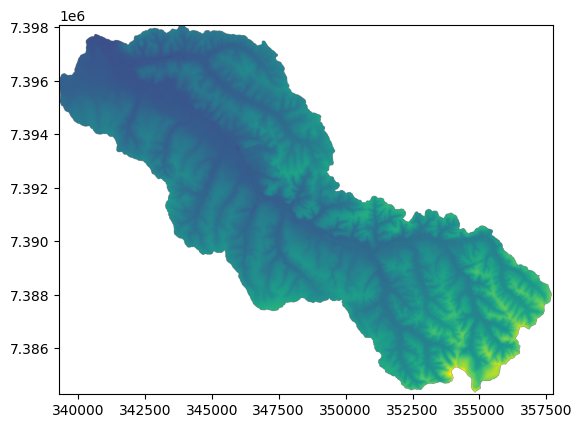

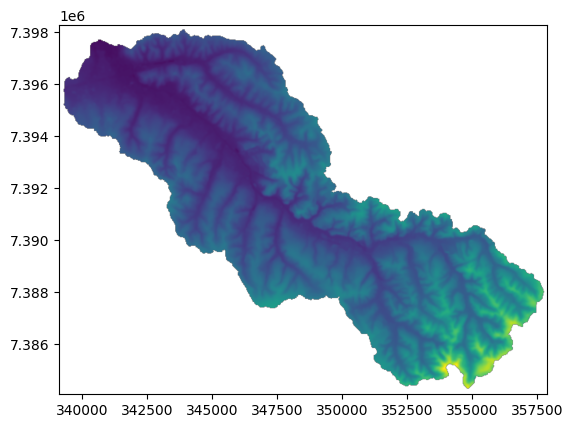

In [5]:
fp = "../dados/geosampa_5m.tif"
with rasterio.open(fp) as src:
    show(src)
fp = "../dados/anadem_5m.tif"
with rasterio.open(fp) as src:
    show(src)

In [ ]:
fp = "../dados/geosampa_5m.tif"
with rasterio.open(fp) as src:
    res_x = abs(src.transform.a)
    res_y = abs(src.transform.e)
    print(f"Resolução X: {res_x} m")
    print(f"Resolução Y: {res_y} m")

Resolução X: 5.0 m
Resolução Y: 5.0 m


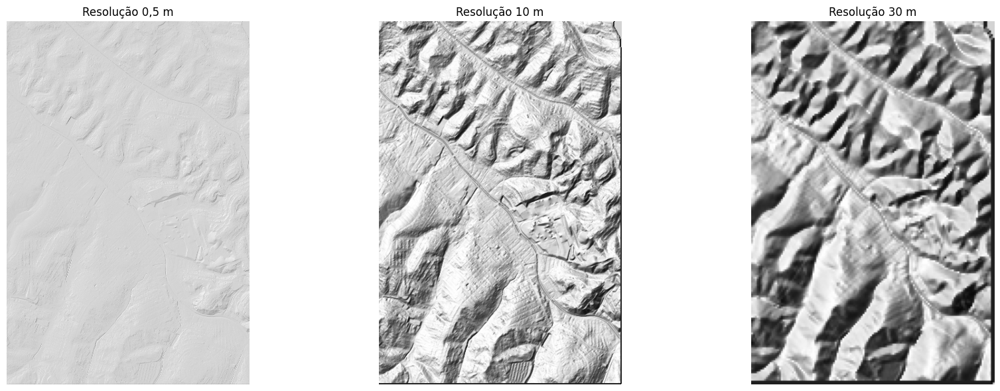

In [5]:
# ---------- Hillshade ----------
hs_05 = hillshade(data_05m)
hs_10 = hillshade(data_10m)
hs_30 = hillshade(data_30m)

# ---------- Plot ----------
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(hs_05, cmap="gray")
axes[0].set_title("Resolução 0,5 m")
axes[0].axis("off")

axes[1].imshow(hs_10, cmap="gray")
axes[1].set_title("Resolução 10 m")
axes[1].axis("off")

axes[2].imshow(hs_30, cmap="gray")
axes[2].set_title("Resolução 30 m")
axes[2].axis("off")

plt.tight_layout()
plt.show()

d:\git\capstone_ipt\venv\Lib\site-packages\matplotlib\colors.py:778: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


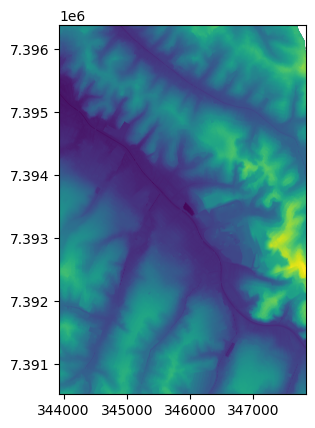

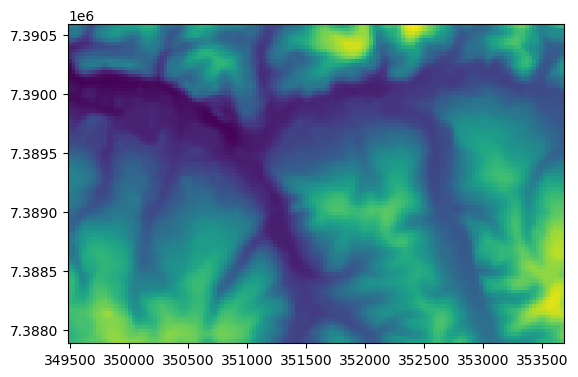

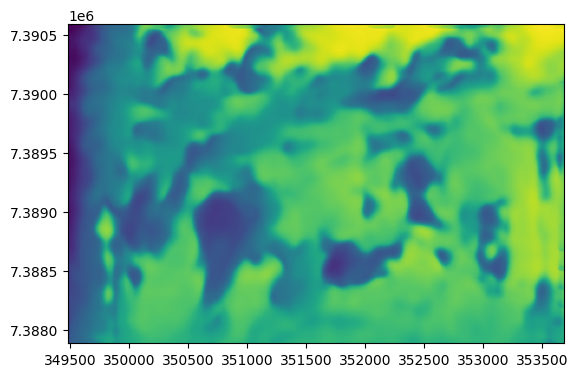

<Axes: >

In [3]:
import os
import rasterio
from rasterio.plot import show
data_dir = "dados"
fp = os.path.join(data_dir, "rec_geosampa.tif")
reprojected = rasterio.open(fp)
show(reprojected)
fp = os.path.join(data_dir, "rec_anadem_teste.tif")
reprojected = rasterio.open(fp)
show(reprojected)
fp = "output_10m.tif"
reprojected = rasterio.open(fp)
show(reprojected)

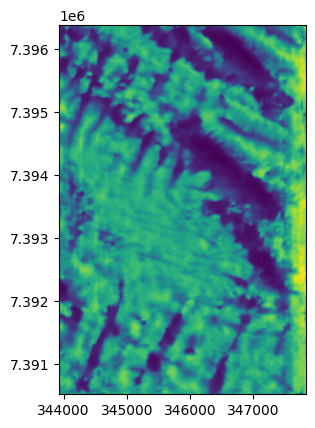

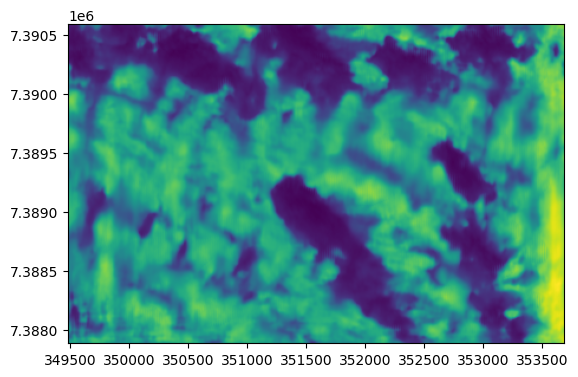

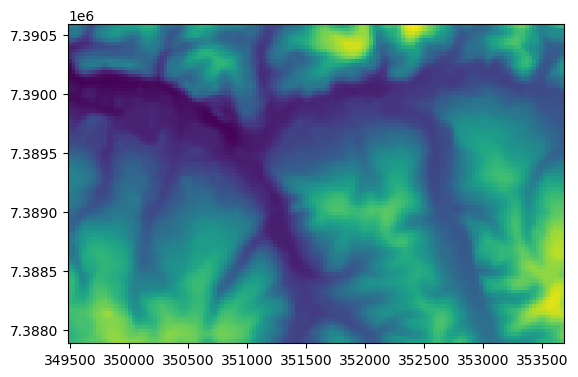

<Axes: >

In [1]:
import os
import rasterio
from rasterio.plot import show
data_dir = "output"
fp = os.path.join(data_dir, "anadem_16f_40ep_10m.tif")
reprojected = rasterio.open(fp)
show(reprojected)
fp = os.path.join(data_dir, "anadem_teste_16f_40ep_10m.tif")
reprojected = rasterio.open(fp)
show(reprojected)
fp = "dados/rec_anadem_teste.tif"
reprojected = rasterio.open(fp)
show(reprojected)

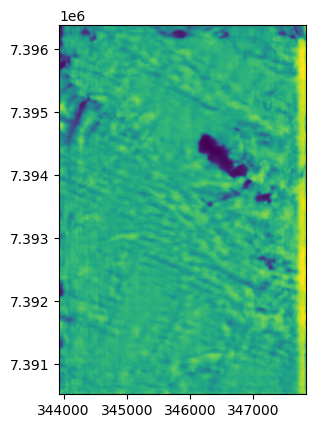

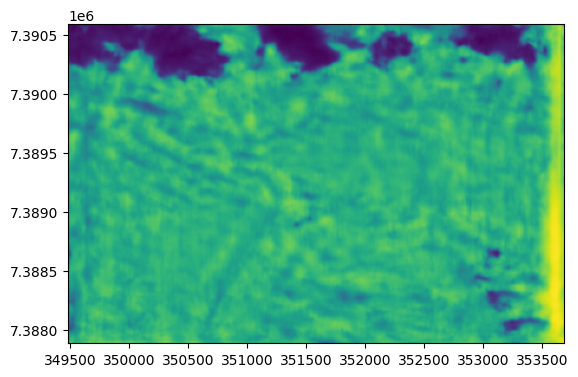

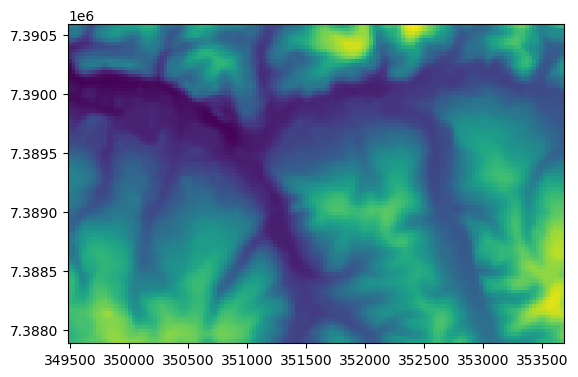

<Axes: >

In [ ]:
import os
import rasterio
from rasterio.plot import show
data_dir = "output"
fp = os.path.join(data_dir, "anadem_16f_120ep_10m.tif")
reprojected = rasterio.open(fp)
show(reprojected)
fp = os.path.join(data_dir, "anadem_teste_16f_120ep_10m.tif")
reprojected = rasterio.open(fp)
show(reprojected)
fp = "dados/rec_anadem_teste.tif"
reprojected = rasterio.open(fp)
show(reprojected)

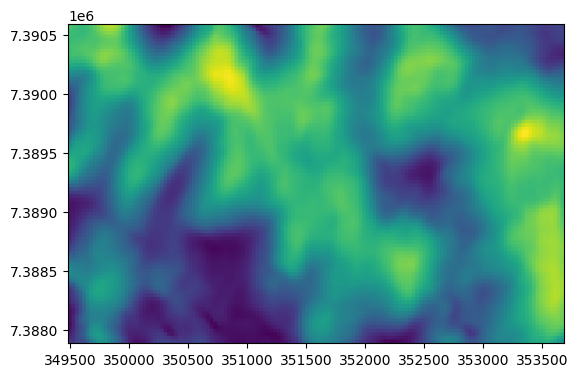

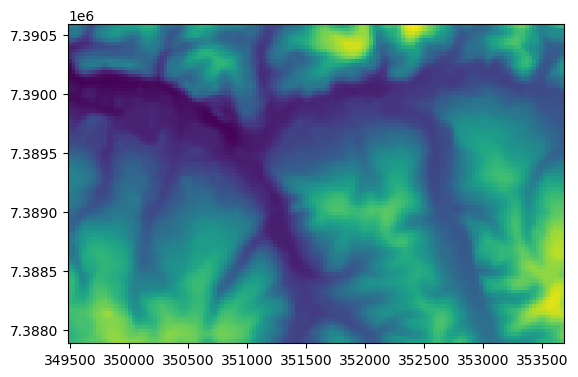

<Axes: >

In [2]:
import os
import rasterio
from rasterio.plot import show

fp = "rec_anadem_teste_40epc_v2.tif"
reprojected = rasterio.open(fp)
show(reprojected)
fp = "dados/rec_anadem_teste.tif"
reprojected = rasterio.open(fp)
show(reprojected)

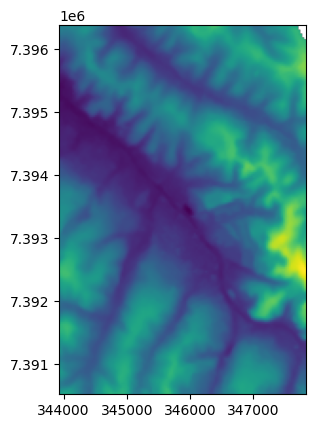

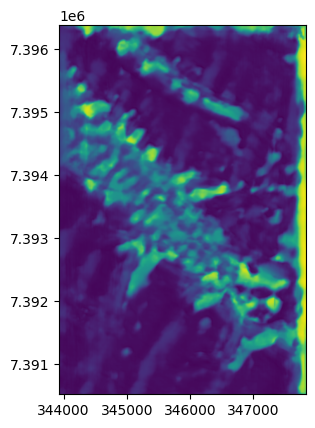

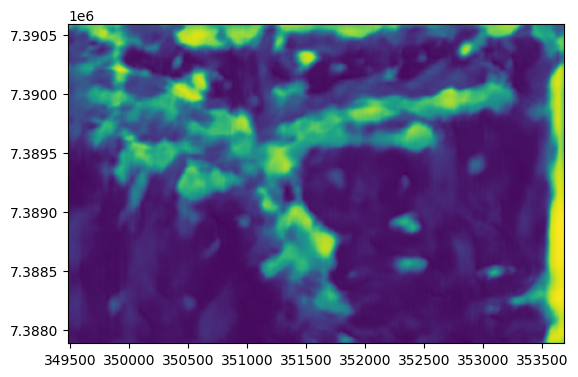

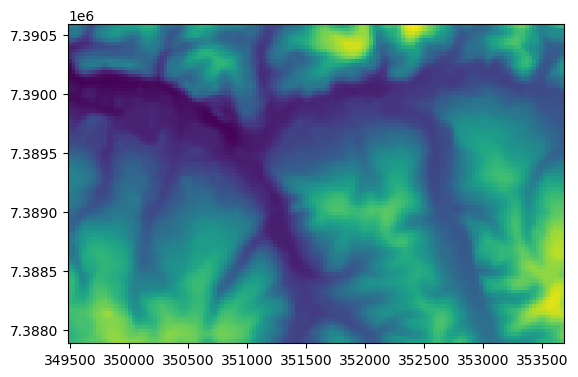

<Axes: >

In [ ]:
fp = "dados/rec_anadem.tif"
reprojected = rasterio.open(fp)
show(reprojected)
data_dir = "output"
fp = os.path.join(data_dir, "anadem_32f_50ep_10m.tif")
reprojected = rasterio.open(fp)
show(reprojected)
fp = os.path.join(data_dir, "anadem_teste_32f_50ep_10m.tif")
reprojected = rasterio.open(fp)
show(reprojected)
fp = "dados/rec_anadem_teste.tif"
reprojected = rasterio.open(fp)
show(reprojected)

d:\git\capstone_ipt\venv\Lib\site-packages\matplotlib\colors.py:778: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


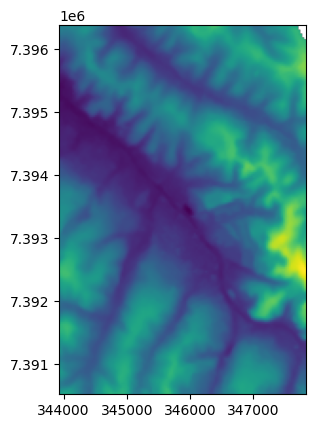

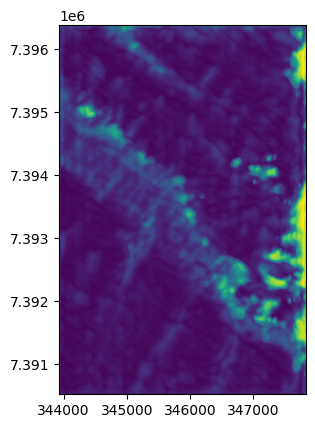

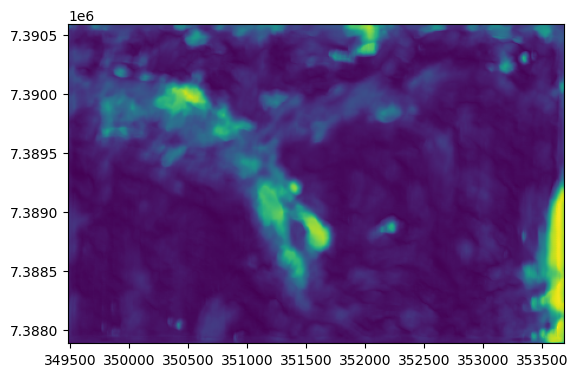

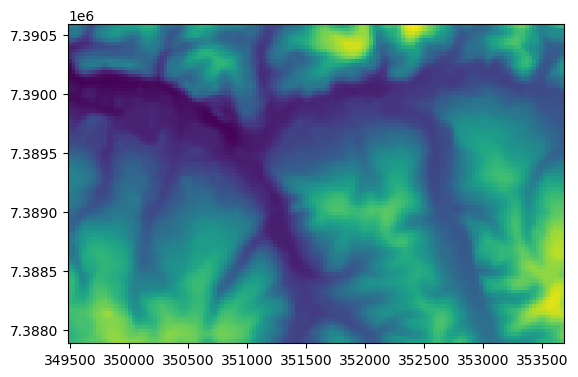

<Axes: >

In [8]:
fp = "dados/rec_anadem.tif"
reprojected = rasterio.open(fp)
show(reprojected)
data_dir = "output"
fp = os.path.join(data_dir, "anadem_32f_150ep_10m.tif")
reprojected = rasterio.open(fp)
show(reprojected)
fp = os.path.join(data_dir, "anadem_teste_32f_150ep_10m.tif")
reprojected = rasterio.open(fp)
show(reprojected)
fp = "dados/rec_anadem_teste.tif"
reprojected = rasterio.open(fp)
show(reprojected)



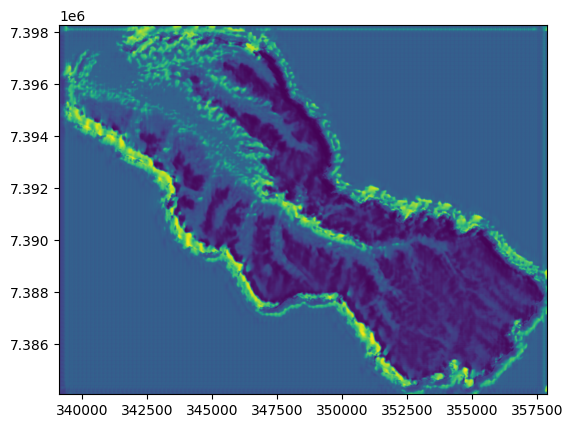

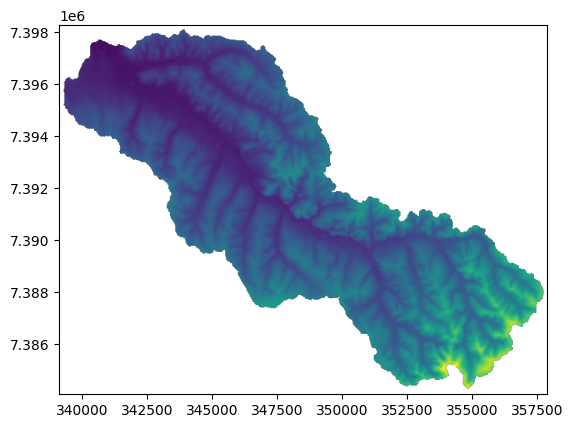

<Axes: >

In [4]:
fp = "output/ANADEM_Aricanduva_16f_30ep_10m.tif"
reprojected = rasterio.open(fp)
show(reprojected)
fp = "dados/ANADEM_AricanduvaBufferUTM.tif"
reprojected = rasterio.open(fp)
show(reprojected)

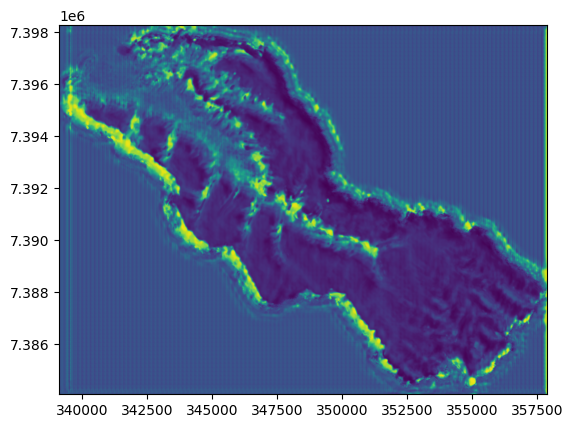

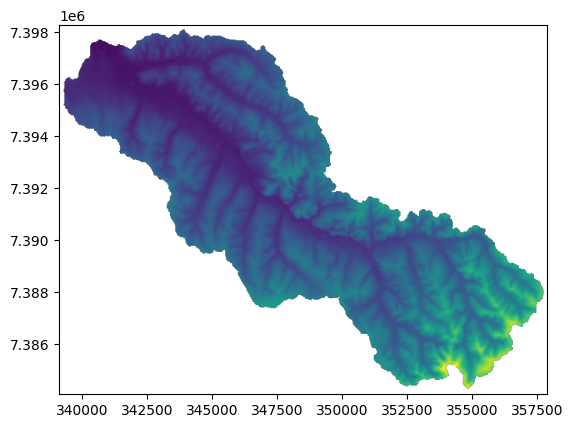

<Axes: >

In [5]:
fp = "output/ANADEM_Aricanduva_16f_80ep_10m.tif"
reprojected = rasterio.open(fp)
show(reprojected)
fp = "dados/ANADEM_AricanduvaBufferUTM.tif"
reprojected = rasterio.open(fp)
show(reprojected)


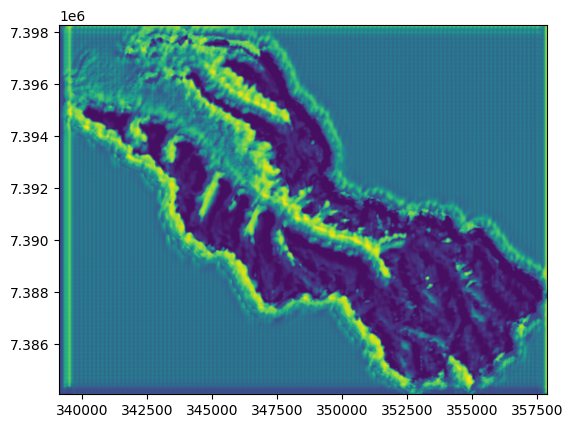

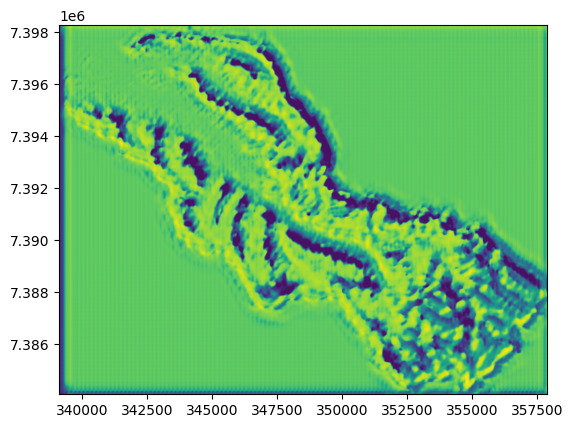

<Axes: >

In [11]:

fp = "output/ANADEM_Aricanduva_16f_40ep_10_bs4.tif"
reprojected = rasterio.open(fp)
show(reprojected)

fp = "output/ANADEM_Aricanduva_16f_40ep_10_bs8.tif"
reprojected = rasterio.open(fp)
show(reprojected)


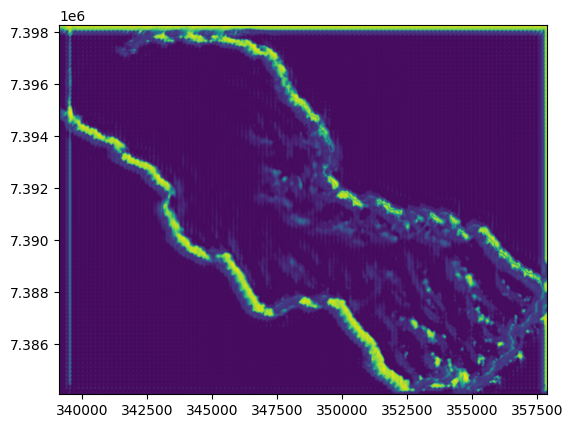

<Axes: >

In [12]:
fp = "output/ANADEM_Aricanduva_16f_20ep_10_bs2_p256.tif"
reprojected = rasterio.open(fp)
show(reprojected)


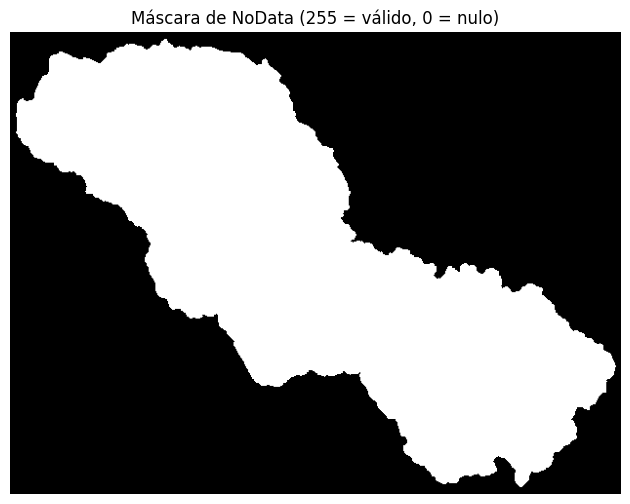

In [14]:
# Visualizar a máscara de NoData do raster
fp = "output/ANADEM_Aricanduva_16f_20ep_10_bs2_p256.tif"
fp = "dados/ANADEM_AricanduvaBufferUTM.tif"
with rasterio.open(fp) as src:
    mask = src.read_masks(1)
    plt.figure(figsize=(8,6))
    plt.imshow(mask, cmap='gray')
    plt.title('Máscara de NoData (255 = válido, 0 = nulo)')
    plt.axis('off')
    plt.show()

In [2]:
# Inspecionar valores do raster de entrada e do output
import numpy as np
import rasterio
def inspect_raster(fp):
    with rasterio.open(fp) as src:
        arr = src.read(1)
        nodata = src.nodata
        print(f"Arquivo: {fp}")
        print(f"NoData: {nodata}")
        print(f"Shape: {arr.shape}")
        print(f"Min: {np.nanmin(arr)} | Max: {np.nanmax(arr)}")
        print(f"Valores únicos: {np.unique(arr)[:10]} ...")
        print(f"Qtd. de nulos: {(arr == nodata).sum()}")
        print(f"Qtd. de válidos: {(arr != nodata).sum()}")
        print()
        return arr, nodata
input_fp = "dados/ANADEM_AricanduvaBufferUTM.tif"
output_fp = "output/ANADEM_Aricanduva_16f_20ep_10_bs2_p256.tif"
arr_in, nodata_in = inspect_raster(input_fp)
arr_out, nodata_out = inspect_raster(output_fp)

Arquivo: dados/ANADEM_AricanduvaBufferUTM.tif
NoData: -3.4028234663852886e+38
Shape: (474, 626)
Min: -3.4028234663852886e+38 | Max: 984.3444213867188
Valores únicos: [-3.4028235e+38  7.1500000e+02  7.1515802e+02  7.1553906e+02
  7.1679669e+02  7.1706189e+02  7.1723859e+02  7.1862805e+02
  7.1888306e+02  7.2074152e+02] ...
Qtd. de nulos: 177820
Qtd. de válidos: 118904

Arquivo: output/ANADEM_Aricanduva_16f_20ep_10_bs2_p256.tif
NoData: -3.4028234663852886e+38
Shape: (1422, 1878)
Min: 736.4676513671875 | Max: 977.2257690429688
Valores únicos: [736.46765 736.4752  737.2391  737.4689  737.49646 737.54736 738.16986
 738.2546  738.3162  738.425  ] ...
Qtd. de nulos: 0
Qtd. de válidos: 2670516

Valores únicos: [736.46765 736.4752  737.2391  737.4689  737.49646 737.54736 738.16986
 738.2546  738.3162  738.425  ] ...
Qtd. de nulos: 0
Qtd. de válidos: 2670516



In [4]:
import numpy as np
from skimage.transform import resize

# Redimensionar a máscara do input para o shape do output
mask_in = (arr_in == nodata_in).astype(np.float32)
mask_in_resized = resize(mask_in, arr_out.shape, order=0, preserve_range=True, anti_aliasing=False)
arr_out_masked = arr_out.copy()
arr_out_masked[mask_in_resized == 1] = nodata_out

In [5]:
import rasterio

output_masked_fp = "output/ANADEM_Aricanduva_16f_20ep_10_bs2_p256_masked.tif"

# Copiar o perfil do output original
with rasterio.open(output_fp) as src_out:
    profile = src_out.profile.copy()
    profile.update({'nodata': nodata_out})

# Salvar o raster mascarado
with rasterio.open(output_masked_fp, "w", **profile) as dst:
    dst.write(arr_out_masked, 1)

print(f"Arquivo salvo: {output_masked_fp}")

Arquivo salvo: output/ANADEM_Aricanduva_16f_20ep_10_bs2_p256_masked.tif


d:\git\capstone_ipt\venv\Lib\site-packages\matplotlib\colors.py:778: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


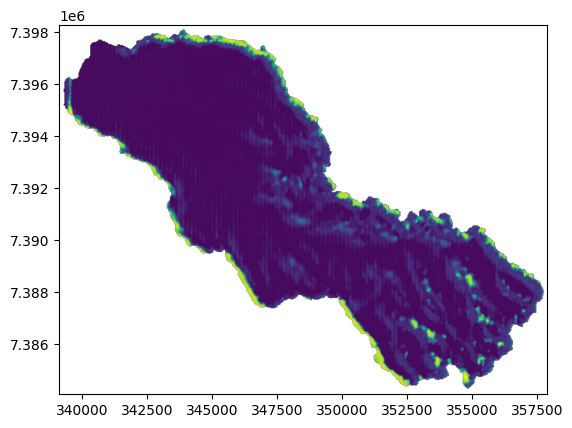

In [6]:
# Visualizar o arquivo mascarado gerado
import rasterio
from rasterio.plot import show
fp = "output/ANADEM_Aricanduva_16f_20ep_10_bs2_p256_masked.tif"
with rasterio.open(fp) as src:
    show(src)

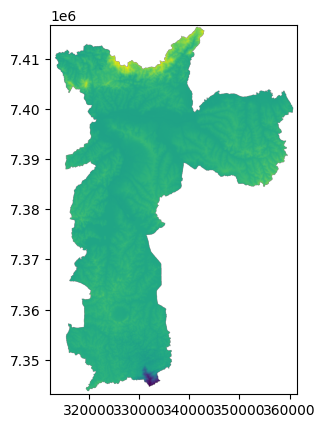

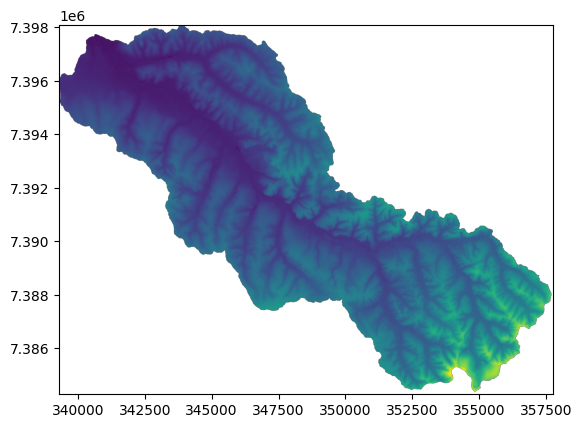

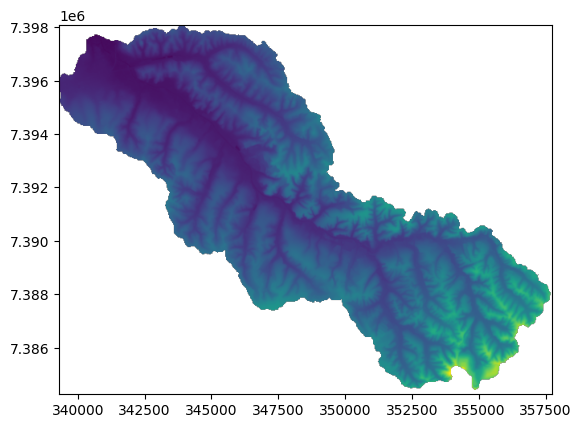

<Axes: >

In [ ]:
import rasterio
from rasterio.plot import show
fp = "D:\casptone\ANADEM_SampaUTM\ANADEM_SampaUTM.tif"
with rasterio.open(fp) as src:
    show(src)
# fp = "dados/MDTGeosampa_AricanduvaBufferUTM.tif"
# reprojected = rasterio.open(fp)
# show(reprojected)    
fp = "dados/geosampa_10m.tif"
reprojected = rasterio.open(fp)
show(reprojected)
fp = "dados/geosampa_30m.tif"
reprojected = rasterio.open(fp)
show(reprojected)

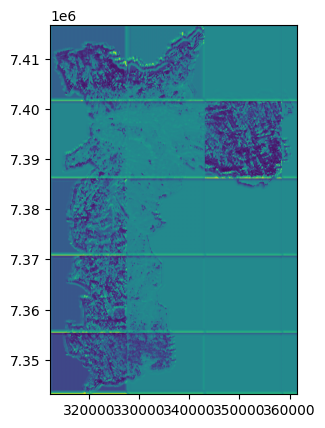

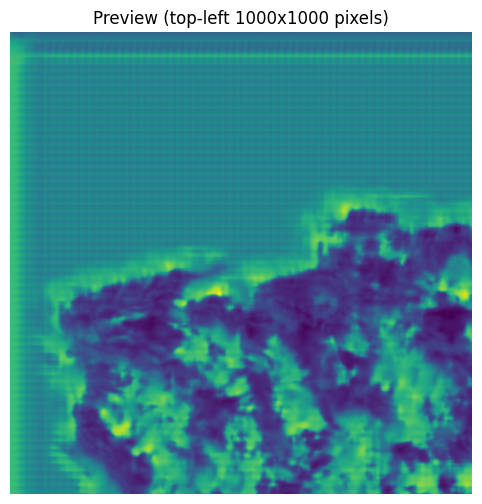

In [3]:
import rasterio
from rasterio.plot import show
import numpy as np
import matplotlib.pyplot as plt

fp = "../output/ANADEM_SP_50ep_16f_10m.tif"
with rasterio.open(fp) as src:
    show(src)
    import rasterio

fp = "../output/ANADEM_SP_50ep_16f_10m.tif"
with rasterio.open(fp) as src:
    # Read a small window (e.g., top-left 1000x1000 pixels)
    window = rasterio.windows.Window(0, 0, 1000, 1000)
    arr = src.read(1, window=window)
    plt.figure(figsize=(8,6))
    plt.imshow(arr, cmap='viridis')
    plt.title("Preview (top-left 1000x1000 pixels)")
    plt.axis('off')
    plt.show()

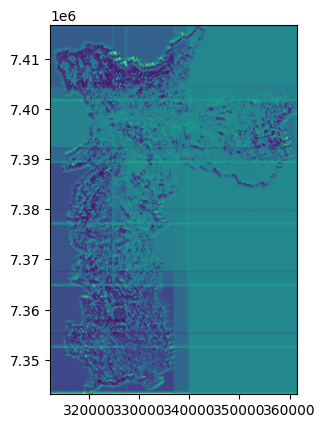

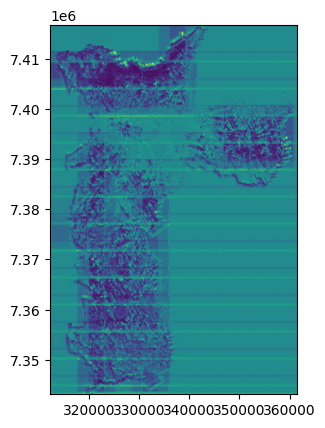

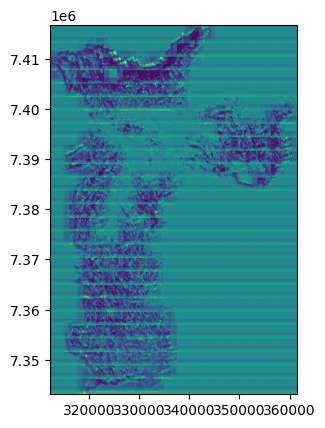

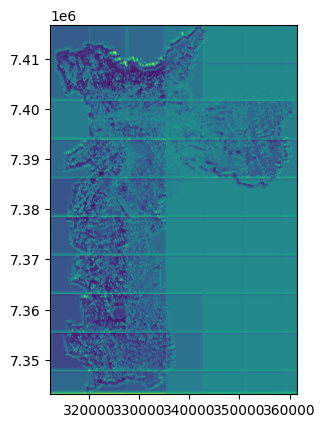

In [10]:
fp = "../output/ANADEM_SP_50ep_16f_10m_overlap20.tif"
with rasterio.open(fp) as src:
    show(src)
fp = "../output/ANADEM_SP_50ep_16f_10m_overlap30.tif"
with rasterio.open(fp) as src:
    show(src)
fp = "../output/ANADEM_SP_50ep_16f_10m_overlap30_128tile.tif"
with rasterio.open(fp) as src:
    show(src)
fp = "../output/ANADEM_SP_50ep_16f_10m_overlap50_128tile.tif"
with rasterio.open(fp) as src:
    show(src)
    

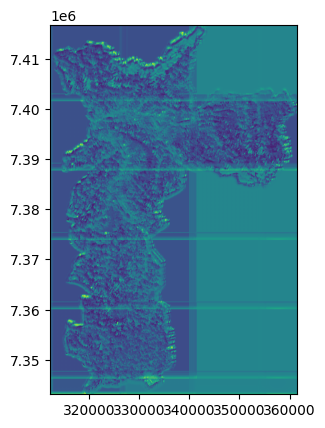

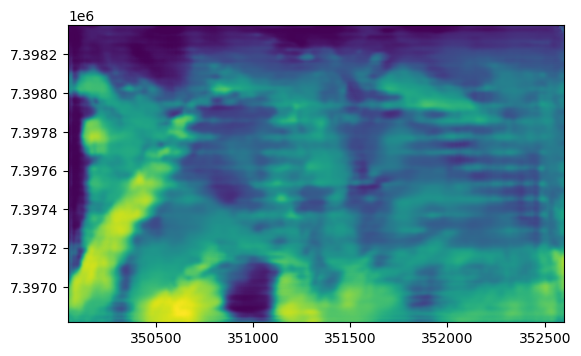

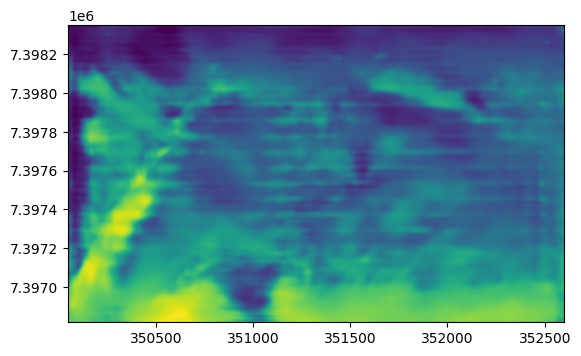

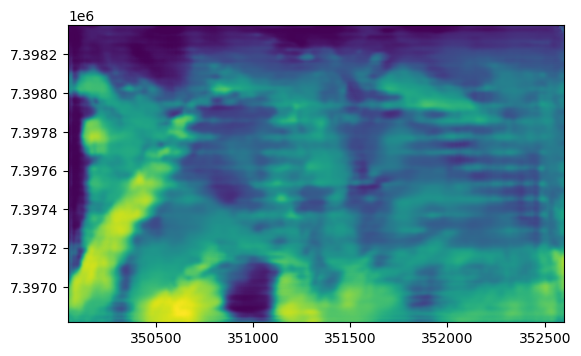

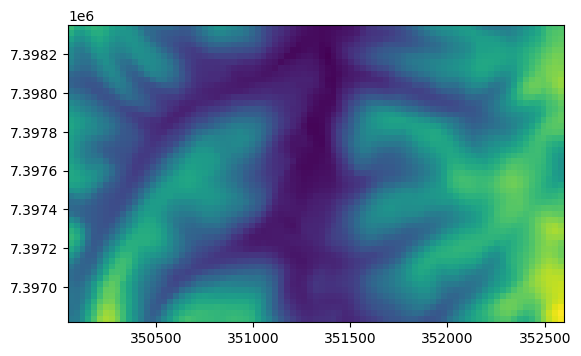

In [3]:

fp = "../output/ANADEM_SP_100ep_16f_10m.tif"
with rasterio.open(fp) as src:
    show(src)


fp = "../output/ANADEM_Recorte_IPT_200ep_16f_5m.tif"
with rasterio.open(fp) as src:
    show(src)

fp = "../output/ANADEM_Recorte_IPT_200ep_16f_5m_v2.tif"
with rasterio.open(fp) as src:
    show(src)

fp = "../output/ANADEM_Recorte_IPT_200ep_16f_5m_v3.tif"
with rasterio.open(fp) as src:
    show(src)


    fp = "../dados/ANADEM_Recorte_IPT.tif"
with rasterio.open(fp) as src:
    show(src)
    

d:\git\capstone_ipt\venv\Lib\site-packages\matplotlib\colors.py:778: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


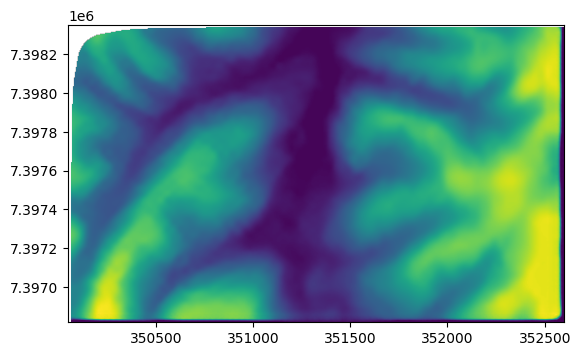

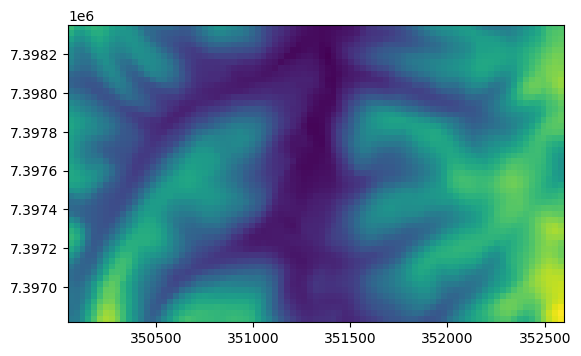

In [4]:
fp = "../output/ANADEM_v2_improved.tif"
with rasterio.open(fp) as src:
    show(src)


    fp = "../dados/ANADEM_Recorte_IPT.tif"
with rasterio.open(fp) as src:
    show(src)

In [7]:
fp = "../output/ANADEM_improved.tif"
with rasterio.open(fp) as src:
    res_x = abs(src.transform.a)
    res_y = abs(src.transform.e)
    print(f"Resolução X: {res_x} m")
    print(f"Resolução Y: {res_y} m")

Resolução X: 5.0 m
Resolução Y: 5.0 m


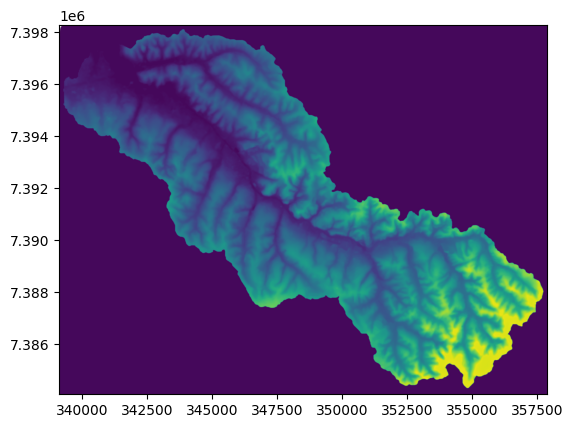

In [6]:
fp = "../output/ANADEM_improved.tif"
with rasterio.open(fp) as src:
    show(src)

d:\git\capstone_ipt\venv\Lib\site-packages\matplotlib\colors.py:778: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


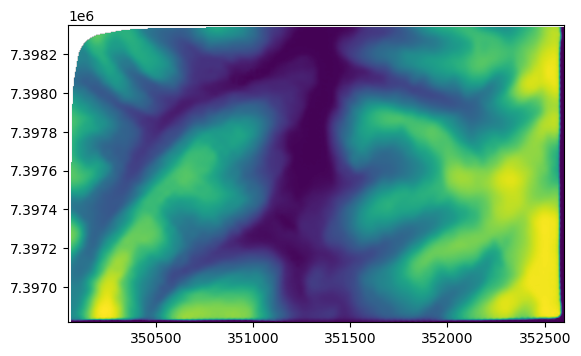

In [2]:
import rasterio
from rasterio.plot import show
fp = "../output/ANADEM_Recorte_IPT_80ep_improved.tif"
with rasterio.open(fp) as src:
    show(src)

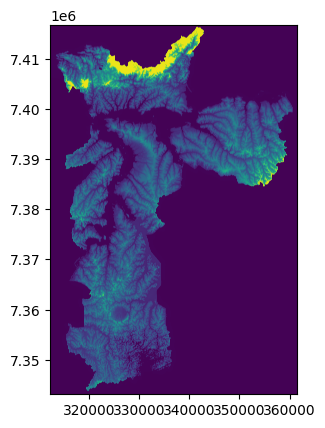

In [3]:
fp = "../output/ANADEM_SampaUTM_80ep_improved.tif"
with rasterio.open(fp) as src:
    show(src)

d:\git\capstone_ipt\venv\Lib\site-packages\matplotlib\colors.py:778: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


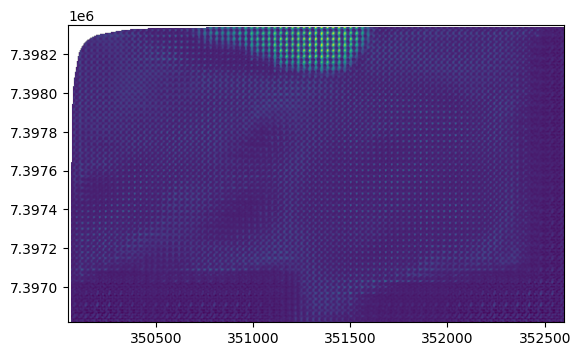

In [3]:

fp = "../output/ANADEM_Recorte_teste_samesize.tif"
with rasterio.open(fp) as src:
    show(src)

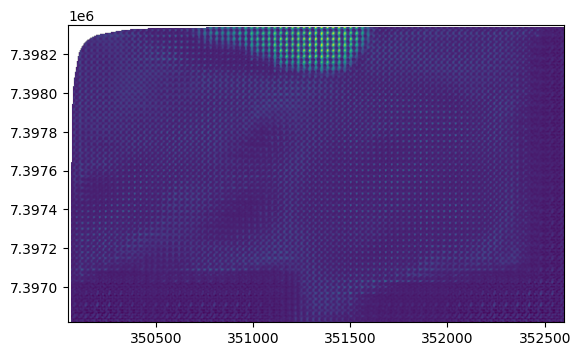

In [4]:
fp = "../output/ANADEM_Recorte_teste_samesize.tif"
with rasterio.open(fp) as src:
    show(src)

d:\git\capstone_ipt\venv\Lib\site-packages\matplotlib\colors.py:778: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


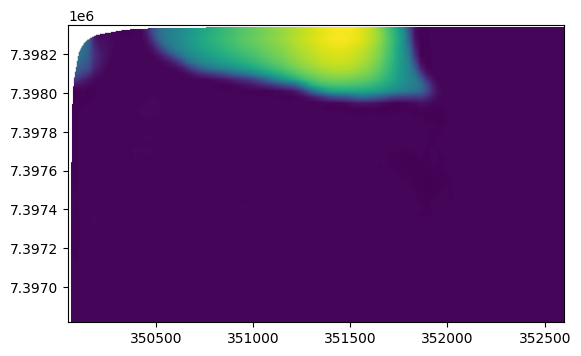

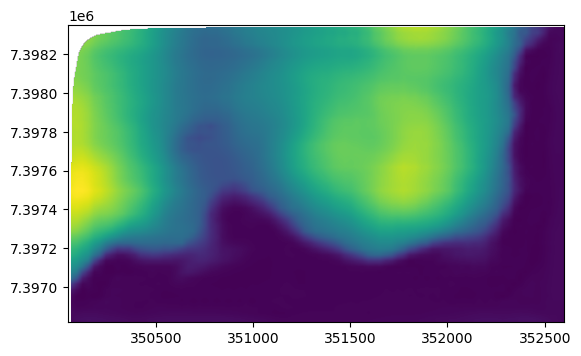

In [3]:
fp = "../output/ANADEM_Recorte_teste_30_samesize.tif"
with rasterio.open(fp) as src:
    show(src)
fp = "../output/ANADEM_Recorte_teste_20_samesize_32patch.tif"
with rasterio.open(fp) as src:
    show(src)

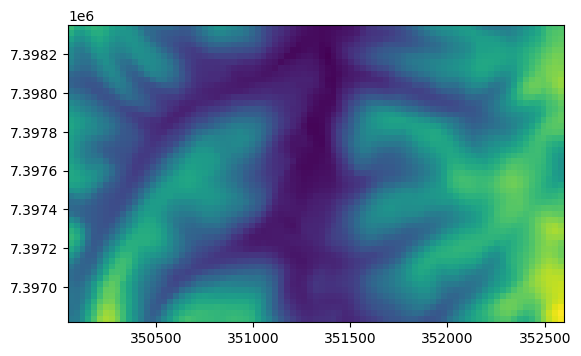

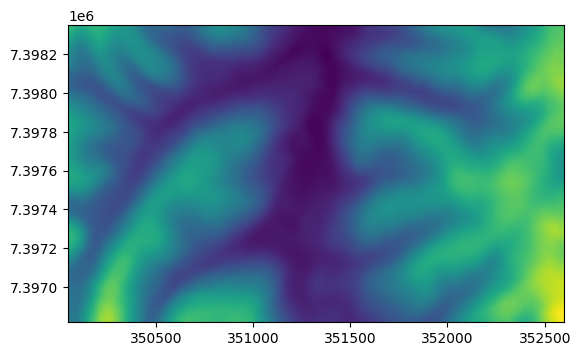

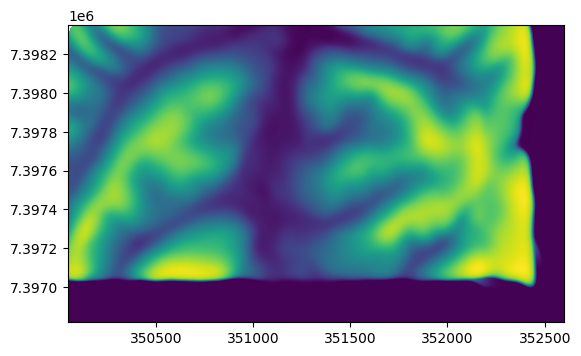

In [11]:
fp = "../dados/ANADEM_Recorte_IPT.tif"
with rasterio.open(fp) as src:
    show(src)
fp = "../dados/ANADEM_Recorte_IPT_5m.tif"
with rasterio.open(fp) as src:
    show(src)
    #  unet3
fp = "../output/ANADEM_Recorte_REFINADO.tif"
with rasterio.open(fp) as src:
    show(src)

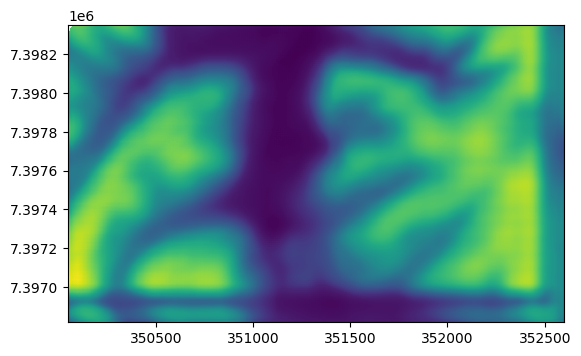

In [ ]:
# unet3
fp = "../output/ANADEM_Recorte_IPT_5m_improved_from_unet_adam.tif"
with rasterio.open(fp) as src:
    show(src)

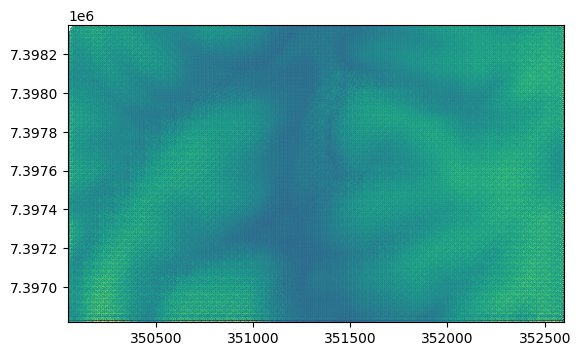

In [ ]:
# unet.py
fp = "../output/ANADEM_Recorte_IPT_5m_improved_unet.tif"
with rasterio.open(fp) as src:
    show(src)

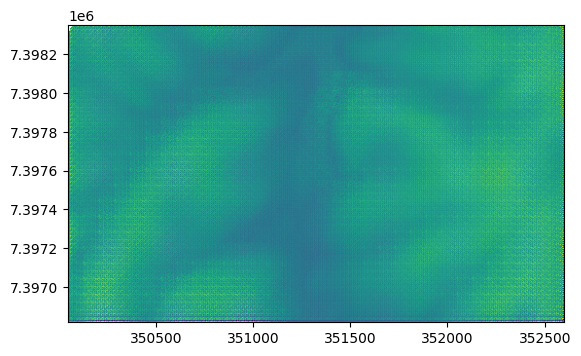

In [6]:
fp = "../output/ANADEM_Recorte_IPT_5m_improved_unet_20ep.tif"
with rasterio.open(fp) as src:
    show(src)

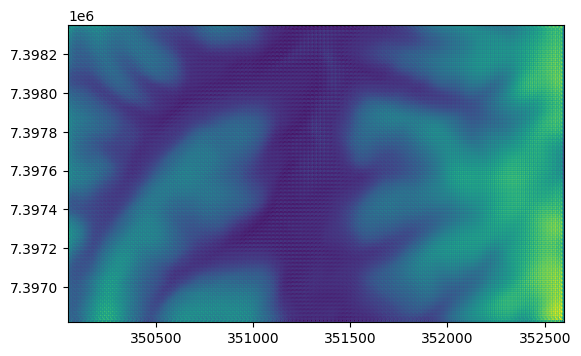

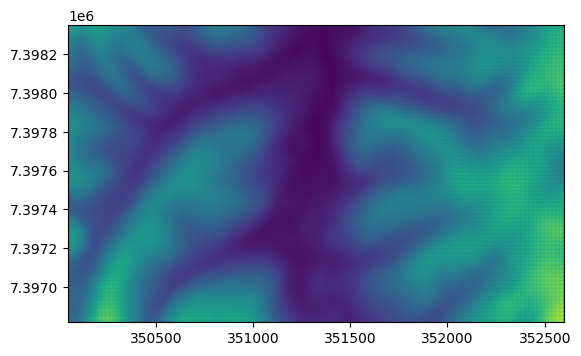

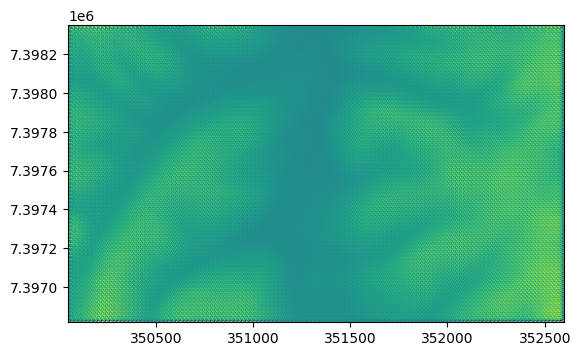

In [10]:
fp = "../output/ANADEM_msk_30ep.tif"
with rasterio.open(fp) as src:
    show(src)

fp = "../output/ANADEM_msk_30ep_geosampa30para5.tif"
with rasterio.open(fp) as src:
    show(src)

fp = "../output/ANADEM_clean_nomask.tif"
with rasterio.open(fp) as src:
    show(src)
    

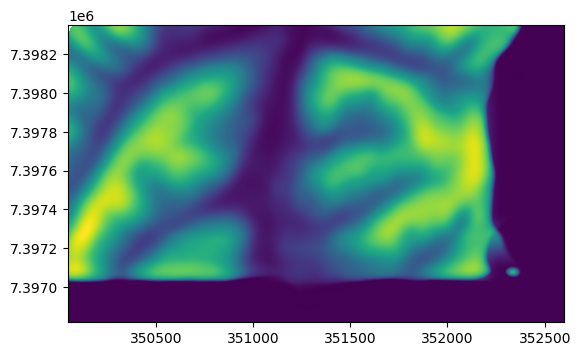

In [ ]:
# 30EPOCAS unet3
fp = "../output/ANADEM_Recorte_REFINADO_10ep.tif"
with rasterio.open(fp) as src:
    show(src)

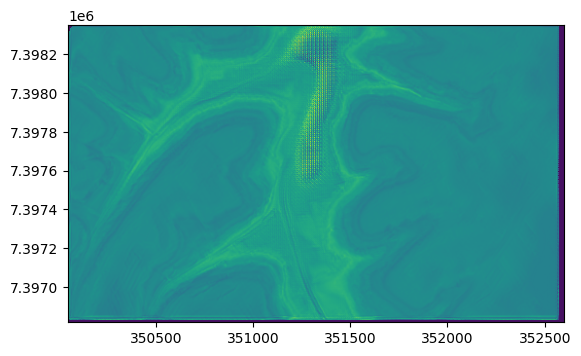

In [ ]:
#  unet2 50 epocas
fp = "../output/resultado_unet_dual_input.tif"
with rasterio.open(fp) as src:
    show(src)

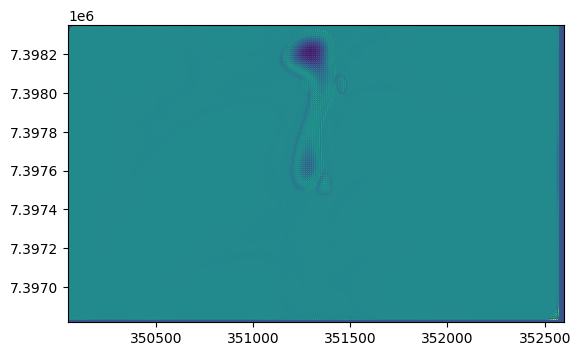

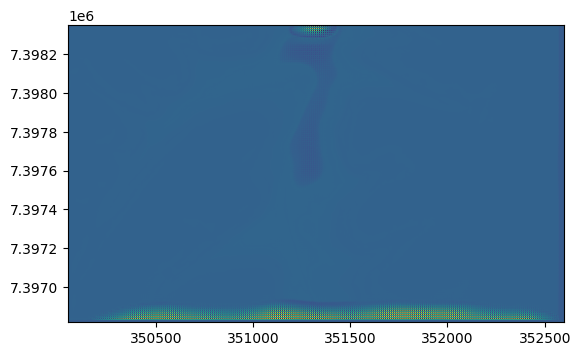

In [4]:
#  unet2 90 epocass
fp = "../output/resultado_unet_dual_input.tif"
with rasterio.open(fp) as src:
    show(src)
fp = "../output/resultado_unet_dual_input_50.tif"
with rasterio.open(fp) as src:
    show(src)